# Airbnb Price Prediction

In [1]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.dummy import DummyRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

In [2]:
plt.style.use("seaborn")
plt.rcParams['font.size'] = 16

## Dataset

This is an Airbnb price prediction project based on https://www.kaggle.com/kritikseth/us-airbnb-open-data

The main goal of our model is to predict the price of an AirBnB listing based on the features they have. AirBnB might want to implement a feature called suggested price, where the user lists all of the features, such as location, number of rooms, and amount of space for their listing, then the app would recommend them a reasonable price to improve a better environment for both the users and the consumers.

Since we are trying to predict a numerical feature, we are using regressions to predict. We are using Dummy, Ridge, LGBM, and XGBoost to fit our models, and to use the RMSE to determine which has the highest test score. We would expect the ensemble methods to perform better, ie LGBM and XGBoost.

## Data Exploration

In [3]:
df = pd.read_csv("AB_US_2020.csv", low_memory=False)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,city
0,38585,Charming Victorian home - twin beds + breakfast,165529,Evelyne,NaN,28804,35.65146,-82.62792,Private room,60,1,138,16/02/20,1.14,1,0,Asheville
1,80905,French Chic Loft,427027,Celeste,NaN,28801,35.59779,-82.55540,Entire home/apt,470,1,114,07/09/20,1.03,11,288,Asheville
2,108061,Walk to stores/parks/downtown. Fenced yard/Pet...,320564,Lisa,NaN,28801,35.60670,-82.55563,Entire home/apt,75,30,89,30/11/19,0.81,2,298,Asheville
3,155305,Cottage! BonPaul + Sharky's Hostel,746673,BonPaul,NaN,28806,35.57864,-82.59578,Entire home/apt,90,1,267,22/09/20,2.39,5,0,Asheville
4,160594,Historic Grove Park,769252,Elizabeth,NaN,28801,35.61442,-82.54127,Private room,125,30,58,19/10/15,0.52,1,0,Asheville


In [4]:
df_train, df_test = train_test_split(df, random_state=123)

In [5]:
df_train.shape

(169522, 17)

#### data exploration
Exploratory data analysis, including outlier detection. 

In [6]:
profile = ProfileReport(df_train)

In [7]:
profile.to_notebook_iframe()

<AxesSubplot:>

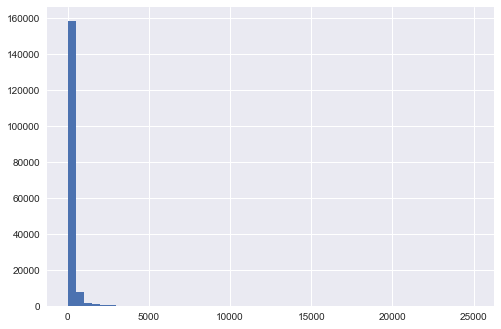

In [8]:
df_train["price"].hist(bins=50)


<AxesSubplot:>

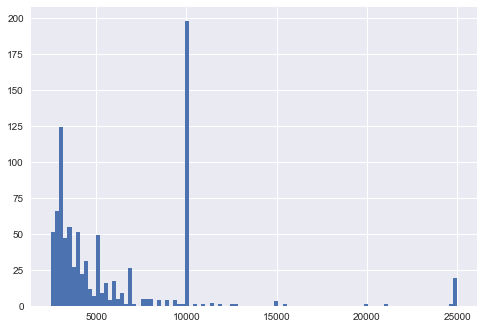

In [9]:
price_target = df_train["price"]
price_target[price_target > 2500].hist(bins=100)

In [10]:
df_train = df_train[df_train['price'] < 2500]
df_test = df_test[df_test['price'] < 2500]

**Discussion:** Most of the prices range from 0 to 2500, and there are a 890 outliers that are above 2500. However, the majorities of the outliers lies below 10000, and the amount of listings for 10000 appeared the most compared to other outlier prices. This is probably because users wanted it as 10000 just for fun, and they did not intent to rent their units. On the other hand, the maximum price 24999 also had quite a few occurence. This is probably due to user trying to set their unit prices to the highest price on the market, just to have their listing on the very top.<br><br>
In the end, we decided that getting rid of the outliers yielded better results.
<br><br>

<AxesSubplot:>

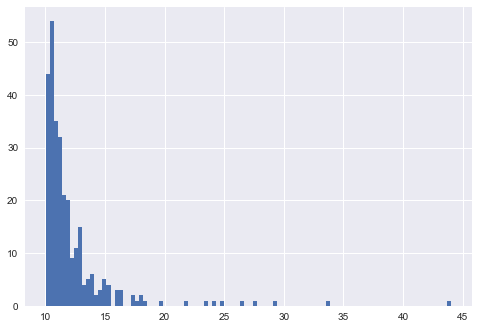

In [11]:
reviews_per_month = df_train["reviews_per_month"]
reviews_per_month[reviews_per_month > 10].hist(bins=100)

In [12]:
df_train = df_train[df_train['reviews_per_month'] < 20]
df_test = df_test[df_test['reviews_per_month'] < 20]

**Discussion:** Most of the listings have around 0 to 10 reviews per month, and there are 293 outliers has more than 10 reviews per month. This is probably because these listings are much currently more popular and active than the overall listings on Airbnb.<br><br>
In the end, we decided that getting rid of the outliers yielded better results.
<br><br>

5346

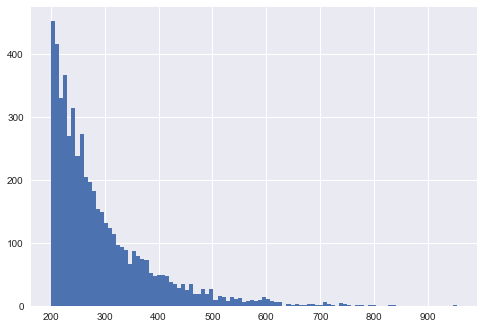

In [13]:
number_of_reviews = df_train["number_of_reviews"]
number_of_reviews[number_of_reviews > 200].hist(bins=100)
number_of_reviews[number_of_reviews > 200].size

**Discussion:** Most of the listings have around 0 to 200 reviews in total, and there are 5352 outliers that has more than 200 reviews in total. These outliers are much more popular and so is very acceptable to the consumer than the overall listings, and we should use these listings for our prediction.
<br><br>

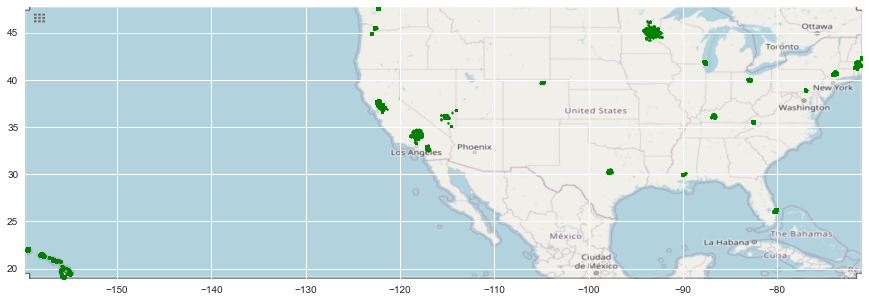

In [14]:
# reference to: https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db
BBox = ((df.longitude.min(), df.longitude.max(), df.latitude.min(), df.latitude.max()))
mmap = plt.imread('./map.png')
fig, ax = plt.subplots(figsize = (15,7))
ax.scatter(df.longitude, df.latitude, c='g', s=3)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(mmap, extent=BBox)

**Discussion:** The outliers here are listings that located to a more rural area, and we would not want to look at those listings as it is generally priced differently.
<br><br>

In [15]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132700 entries, 82306 to 28030
Data columns (total 17 columns):
id                                132700 non-null int64
name                              132693 non-null object
host_id                           132700 non-null int64
host_name                         132682 non-null object
neighbourhood_group               63749 non-null object
neighbourhood                     132700 non-null object
latitude                          132700 non-null float64
longitude                         132700 non-null float64
room_type                         132700 non-null object
price                             132700 non-null int64
minimum_nights                    132700 non-null int64
number_of_reviews                 132700 non-null int64
last_review                       132700 non-null object
reviews_per_month                 132700 non-null float64
calculated_host_listings_count    132700 non-null int64
availability_365                  1

**Discussion:** From the dataframe info above,  we can see that there are missing values in `name`, `neighbourhood_group`, `host_name`, `last_review`, `reviews_per_month`. Specifically, `neighbourhood_group` has more than half of the entries being missing, we decided to take it out of the feature list.
<br><br>

#### Drop features

**Discussion:** From above, we've noticed that more than half of `neighbourhood_group`'s entries have missing data (ie, NaN). Furthermore, we already have `neighbourhood`, which can act as a substitute. We also dropped `id` and `host_name` since they have are not useful for prediction as they are completely out of context. We dropped `last_review` because it depends on the time the dataset was gathered.

In [16]:
drop_features = ["neighbourhood_group", "id", "host_name", "last_review"]
df_train_proc = df_train.drop(drop_features, axis=1)
df_test_proc = df_test.drop(drop_features, axis=1)

## Preprocess Pipeline

In [17]:
numeric_features = ["latitude", "longitude", "number_of_reviews", "reviews_per_month", "calculated_host_listings_count", "availability_365"]
categorical_features = ["city", "room_type", "neighbourhood"]

In [18]:
# initialize numeric features pipeline
numeric_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# initialize categoric features pipeline
categorical_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='?')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# initialize word features pipeline (countvec)
countvec_transformer = Pipeline([
    ("countvec", CountVectorizer(max_features=1000, 
                                 decode_error='ignore',
                                 stop_words=None))
])

# initialize and combine preprocessor pipelines
preprocessor = ColumnTransformer([
    ('numeric', numeric_transformer, numeric_features),
    ('categorical', categorical_transformer, categorical_features),
    ('countvec', countvec_transformer, "name")
])

## Model Comparisons

In [19]:
df_train["name"].fillna(' ')
df_test["name"].fillna(' ')

X_train = (df_train_proc.loc[:, df_train_proc.columns != "price"]).astype("U")
y_train = df_train_proc["price"]

X_test = (df_test_proc.loc[:, df_test_proc.columns != "price"]).astype("U")
y_test = df_test_proc["price"]

In [20]:
# ----------------
# dummy model
# ----------------
dummy_pipe = make_pipeline(preprocessor, DummyRegressor())
dummy_pipe.fit(X_train, y_train)

# get predictions 
dummy_preds = dummy_pipe.predict(X_train)

# get mean squared error & r2
dummy_rmse_score = np.sqrt(mean_squared_error(y_train, dummy_preds))
dummy_r2_score = r2_score(y_train, dummy_preds)
print("Dummy Scores: RMSE =", dummy_rmse_score, ", r2 =", dummy_r2_score)

Dummy Scores: RMSE = 184.05307242941524 , r2 = 0.0


In [21]:
# ----------------
# ridge model
# ----------------
ridge_pipe = make_pipeline(preprocessor, Ridge(alpha=100, random_state=123))
ridge_pipe.fit(X_train, y_train)

# get predictions 
ridge_preds = ridge_pipe.predict(X_train)

# get mean squared error & r2
ridge_rmse_score = np.sqrt(mean_squared_error(y_train, ridge_preds))
ridge_r2_score = r2_score(y_train, ridge_preds)
print("Ridge Scores: RMSE =", ridge_rmse_score, ", r2 =", ridge_r2_score)

Ridge Scores: RMSE = 151.43667329265372 , r2 = 0.32301978246995466


In [22]:
# ----------------
# LGBM model
# ----------------
lgbm_pipe = make_pipeline(preprocessor, LGBMRegressor(random_state=123))
lgbm_pipe.fit(X_train, y_train)

# get predictions 
lgbm_preds = lgbm_pipe.predict(X_train)

# get mean squared error & r2
lgbm_rmse_score = np.sqrt(mean_squared_error(y_train, lgbm_preds))
lgbm_r2_score = r2_score(y_train, lgbm_preds)
print("LGBM Scores: RMSE =", lgbm_rmse_score, ", r2 =", lgbm_r2_score)

LGBM Scores: RMSE = 139.2572841260936 , r2 = 0.42753399886840215


In [23]:
# ----------------
# XGBoost model
# ----------------
xg_pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', XGBRegressor(random_state=123))
])
xg_pipe.fit(X_train, y_train)

# get predictions 
xg_preds = xg_pipe.predict(X_train)

# get mean squared error & r2
xg_rmse_score = np.sqrt(mean_squared_error(y_train, xg_preds))
xg_r2_score = r2_score(y_train, xg_preds)
print("XGBoost Scores: RMSE =", xg_rmse_score, ", r2 =", xg_r2_score)

# print(xg_pipe)

XGBoost Scores: RMSE = 125.98305864798027 , r2 = 0.5314691920637991


## Hyperparameter Tuning

**Discussion:** From the results above, we see that XGBoost has the best base model. Thus, we will do our hyperparameter tuning based on XGBoost.

In [24]:
# hyperparam options
hypers = {
    'classifier__max_depth' : [5,6,7],
    'classifier__learning_rate' : [0.3,0.2,0.1,0.01]
}

# initialize grid search with pipe
grid_search_xg = GridSearchCV(xg_pipe, hypers, scoring=make_scorer(r2_score), n_jobs=-1, verbose=5, return_train_score=True, cv=5)

# fit grid search
grid_search_xg.fit(X_train, y_train)

print("Best params: ", grid_search_xg.best_params_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 out of  60 | elapsed:  2.3min remaining:   59.4s
[Parallel(n_jobs=-1)]: Done  55 out of  60 | elapsed:  2.6min remaining:   14.4s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.8min finished


Best params:  {'classifier__learning_rate': 0.3, 'classifier__max_depth': 7}


In [25]:
optimized_xgboost = grid_search_xg.best_estimator_

gs_xg_train_preds = optimized_xgboost.predict(X_train)
xg_rmse_train_score = np.sqrt(mean_squared_error(y_train, gs_xg_train_preds))
xg_r2_train_score = r2_score(y_train, gs_xg_train_preds)
print("XGBoost Train Scores: RMSE =", xg_rmse_train_score, ", r2 =", xg_r2_train_score)

XGBoost Train Scores: RMSE = 119.16906967581082 , r2 = 0.5807810029123764


#### Cross validation analysis


In [26]:
grid_search_xg.cv_results_
columns = [
    'mean_test_score', 'mean_train_score', 'mean_fit_time', 'rank_test_score', 'param_classifier__learning_rate', 'param_classifier__max_depth'
]
pd.DataFrame(grid_search_xg.cv_results_)[columns].sort_values(by=['rank_test_score'])

,mean_test_score,mean_train_score,mean_fit_time,rank_test_score,param_classifier__learning_rate,param_classifier__max_depth
2,0.386021,0.596657,42.977566,1,0.3,7
5,0.383489,0.556052,41.077602,2,0.2,7
1,0.377860,0.552377,37.211676,3,0.3,6
4,0.371272,0.511531,36.327804,4,0.2,6
0,0.369081,0.499738,31.166647,5,0.3,5
3,0.358604,0.461425,31.413465,6,0.2,5
8,0.357217,0.480680,41.608164,7,0.1,7
7,0.343613,0.436730,35.673011,8,0.1,6
6,0.328009,0.394105,30.513158,9,0.1,5
11,0.085521,0.106969,24.395073,10,0.01,7


**Discussion:** From the result, we can see that the model with the highest learning rate, and highest depth had the highest test score of 0.386021.

#### Scores

In [27]:
# get train accuracy 
gs_xg_train_preds = optimized_xgboost.predict(X_train)
xg_rmse_train_score = np.sqrt(mean_squared_error(y_train, gs_xg_train_preds))
xg_r2_train_score = r2_score(y_train, gs_xg_train_preds)
print("XGBoost Train Scores: RMSE =", xg_rmse_train_score, ", r2 =", xg_r2_train_score)

# get test accuracy 
gs_xg_test_preds = grid_search_xg.predict(X_test)
xg_rmse_test_score = np.sqrt(mean_squared_error(y_test, gs_xg_test_preds))
xg_r2_test_score = r2_score(y_test, gs_xg_test_preds)
print("XGBoost Test Scores: RMSE =", xg_rmse_test_score, ", r2 =", xg_r2_test_score)

XGBoost Train Scores: RMSE = 119.16906967581082 , r2 = 0.5807810029123764
XGBoost Test Scores: RMSE = 142.82141975612154 , r2 = 0.396821245118786


#### Evaluations

**Discussion:** From the results, we can see that our model has overfitted a little. This is probably because we did not have enough data, and did not have enought features. Features of the listings that would greatly influence prices such as number of bathrooms, year of the building, patio, and bed sizes are not included in the dataset. Therefore, we would not rate this model as an accurate assessment for the pricing of a AirBnB listing.